In [266]:
from pandasql import sqldf
import pandas as pd
import numpy as np
import csv
import seaborn as sns
import  matplotlib.pyplot as plt
import re
pysqldf = lambda q: sqldf(q, globals())

In [247]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 787 entries, 0 to 786
Columns: 139 entries, Sl. No. to Electric_Range
dtypes: float64(26), int64(7), object(106)
memory usage: 854.8+ KB


In [267]:
df.shape

(787, 139)

In [299]:
df = pd.read_csv("Automobile_data.csv", encoding='utf8')
pd.options.display.max_columns = None
pd.options.display.max_rows = None
df

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,Fuel_Tank_Capacity_litre,Fuel_Type,Height_mm,Length_mm,Width_mm,Body_Type,Doors,City_Mileage_km_litre,Highway_Mileage_km_litre,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space_litre,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.60,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,Electric Power,Only Front Windows,NaN,Remote,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,Yes,Yes,CD Player with USB & Aux-in,Yes,Yes,2 years /75000 Kms (years/distance whichever c...,Yes,Internal,110.0,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,2 years /150000 Kms (years/distance whichever ...,Yes,Internal,Digital,Manual,Analog + Digital,Yes,4.00,Yes,Driver & Front Passenger,Not Applicable,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.60,NaN,23.6 km/litre,NaN,725 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,NaN,NaN,NaN,NaN,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,NaN,Yes,Not on offer,NaN,Yes,2 years /75000 Kms (years/distance whichever c...,NaN,Internal,110.0,NaN,NaN,Yes,Digital,Front,

In [269]:
pd.reset_option('display.max_columns')
pd.reset_option('display.max_rows')

In [272]:
cat_name = list(df.select_dtypes(include='object').columns)
cat_name

['Make',
 'Model',
 'Variant',
 'Drivetrain',
 'Cylinder_Configuration',
 'Engine_Location',
 'Fuel_System',
 'Fuel_Type',
 'Body_Type',
 'ARAI_Certified_Mileage',
 'ARAI_Certified_Mileage_for_CNG',
 'Kerb_Weight',
 'Gears',
 'Ground_Clearance',
 'Front_Brakes',
 'Rear_Brakes',
 'Front_Suspension',
 'Rear_Suspension',
 'Front_Track',
 'Rear_Track',
 'Front_Tyre_&_Rim',
 'Rear_Tyre_&_Rim',
 'Power_Steering',
 'Power_Windows',
 'Power_Seats',
 'Keyless_Entry',
 'Power',
 'Torque',
 'Odometer',
 'Speedometer',
 'Tachometer',
 'Tripmeter',
 'Seats_Material',
 'Type',
 'Wheelbase',
 'Wheels_Size',
 'Start_/_Stop_Button',
 '12v_Power_Outlet',
 'Audiosystem',
 'Aux-in_Compatibility',
 'Average_Fuel_Consumption',
 'Basic_Warranty',
 'Bluetooth',
 'Boot-lid_Opener',
 'CD_/_MP3_/_DVD_Player',
 'Central_Locking',
 'Child_Safety_Locks',
 'Clock',
 'Cup_Holders',
 'Distance_to_Empty',
 'Door_Pockets',
 'Engine_Malfunction_Light',
 'Extended_Warranty',
 'FM_Radio',
 'Fuel-lid_Opener',
 'Fuel_Gauge',

In [311]:
pattern = re.compile('\d')
cat_num = []

for i in cat_name:
    result = False
    items = df[i].tolist()[0:10]
    
    for j in items:
        if pattern.match(str(j)):
            result = True
            
    if result == True: 
        cat_num.append(i)
df[cat_num]

,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power,Torque,Wheelbase,Wheels_Size,Basic_Warranty,Extended_Warranty
0,23.60,0.00,660.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
1,23.60,0.00,725.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
2,0.00,36.00,710.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
3,21.90,0.00,725.0,5.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
4,23.60,0.00,725.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
5,21.90,0.00,710.0,5.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
6,25.17,0.00,669.0,6.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
7,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2442,165.0,2,0.0
8,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
9,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0


In [300]:
columns_to_duplicate = cat_num
for column in columns_to_duplicate:
    new_column_title = f'{column}_original'
    df[new_column_title] = df[column].copy()
df

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,Fuel_Tank_Capacity_litre,Fuel_Type,Height_mm,Length_mm,Width_mm,Body_Type,Doors,City_Mileage_km_litre,Highway_Mileage_km_litre,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space_litre,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range,ARAI_Certified_Mileage_original,ARAI_Certified_Mileage_for_CNG_original,Kerb_Weight_original,Gears_original,Ground_Clearance_original,Front_Track_original,Rear_Track_original,Front_Tyre_&_Rim_original,Rear_Tyre_&_Rim_original,Power_original,Torque_original,Wheelbase_original,Wheels_Size_original,Basic_Warranty_original,Extended_Warranty_original
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.60,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,Electric Power,Only Front Windows,NaN,Remote,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,Yes,Yes,CD Player with USB & Aux-in,Yes,Yes,2 years /75000 Kms (years/distance whichever c...,Yes,Internal,110.0,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,2 years /150000 Kms (years/distance whichever ...,Yes,Internal,Digital,Manual,Analog + Digital,Yes,4.00,Yes,Driver & Front Passenger,Not Applicable,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,1325 mm,1315 mm,135/70R12,155/65R12,38PS@5500rpm,51Nm@4000rpm,2230 mm,4 B X 12,2 years /75000 Kms (years/distance whichever c...,2 years /150000 Kms (years/distance whichever ...
1,2

In [315]:
df[cat_num] = df[cat_num].replace(np.nan, 0)
pattern2 = r'[A-Za-z\\/].*'

for i in cat_num:
    df[i].replace(pattern2, ' ', regex=True, inplace=True)
    df[i] = pd.to_numeric(df[i], errors='coerce')    

df[cat_num]

,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power,Torque,Wheelbase,Wheels_Size,Basic_Warranty,Extended_Warranty
0,23.60,0.00,660.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
1,23.60,0.00,725.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
2,0.00,36.00,710.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
3,21.90,0.00,725.0,5.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
4,23.60,0.00,725.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
5,21.90,0.00,710.0,5.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
6,25.17,0.00,669.0,6.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
7,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2442,165.0,2,0.0
8,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
9,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0


In [277]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 787 entries, 0 to 786
Columns: 154 entries, Sl. No. to Extended_Warranty_original
dtypes: float64(24), int64(7), object(123)
memory usage: 947.0+ KB


In [276]:
df.head()

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,Fuel_Tank_Capacity_litre,Fuel_Type,Height_mm,Length_mm,Width_mm,Body_Type,Doors,City_Mileage_km_litre,Highway_Mileage_km_litre,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space_litre,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range,ARAI_Certified_Mileage_original,ARAI_Certified_Mileage_for_CNG_original,Kerb_Weight_original,Gears_original,Ground_Clearance_original,Front_Track_original,Rear_Track_original,Front_Tyre_&_Rim_original,Rear_Tyre_&_Rim_original,Power_original,Torque_original,Wheelbase_original,Wheels_Size_original,Basic_Warranty_original,Extended_Warranty_original
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.6,NaN,23.6,0.0,660.0,4.0,180,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325.0,1315.0,135.0,155.0,Electric Power,Only Front Windows,NaN,Remote,38.0,51.0,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230,4.0,Yes,Yes,CD Player with USB & Aux-in,Yes,Yes,2,Yes,Internal,110.0,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,2.0,Yes,Internal,Digital,Manual,Analog + Digital,Yes,4.0,Yes,Driver & Front Passenger,Not Applicable,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,1325 mm,1315 mm,135/70R12,155/65R12,38PS@5500rpm,51Nm@4000rpm,2230 mm,4 B X 12,2 years /75000 Kms (years/distance whichever c...,2 years /150000 Kms (years/distance whichever ...
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.6,Na

<AxesSubplot:>

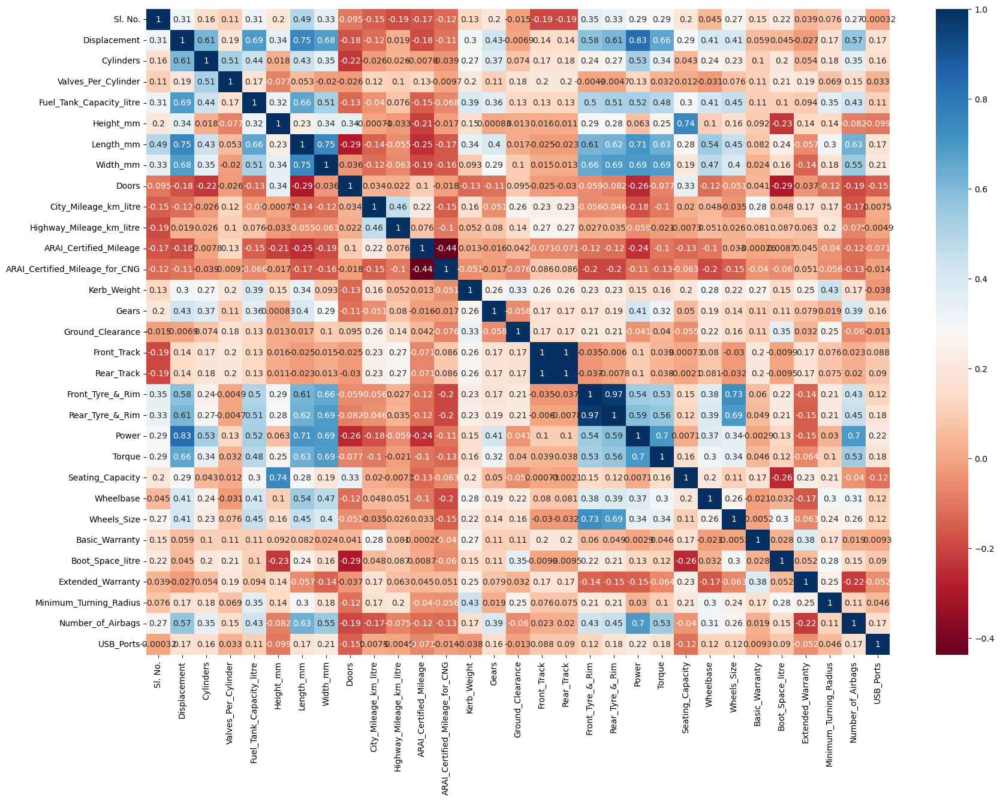

In [265]:
plt.figure(figsize = (20,14))
corr = df.corr()
sns.heatmap(corr, cmap ="RdBu", annot = True)

# Extra work

In [ ]:
#df['column1'].str.replace('[a-z].*', '', regex=True, inplace=True)
#easier but don't use replace
#df['column_name'] = df['column_name'].apply(lambda x: re.sub(r'\/.*', '', x), inplace=True)
#df['ARAI_Certified_Mileage'].[km/litre]
#df['ARAI_Certified_Mileage_for_CNG'].replace('[km/kg]', '', regex=True, inplace=True)
#df['Kerb_Weight'].replace('[kg]', '', regex=True, inplace=True)
#df['Ground_Clearance'].replace('[mm]', '', regex=True, inplace=True)
#df['Front_Track'].replace('[mm]', '', regex=True, inplace=True)
#df['Rear_Track'].replace('[mm]', '', regex=True, inplace=True)
#df['Front_Tyre_&_Rim'].replace(r'/.+', '', regex=True, inplace=True) mm
#df['Rear_Tyre_&_Rim'].replace(r'/.+', '', regex=True, inplace=True) mm
#df['Power'] PS
#df['Torque'] Nm
#df['Wheelbase'].replace('[mm]', '', regex=True, inplace=True)
#df['Wheels_Size']
#df['Basic_Warranty']
#df['Extended_Warranty']
#'Gross_Vehicle_Weight' kg,
# 'Battery' ,
# 'Electric_Range'


In [258]:
pattern = re.compile('\d')
cat_num = []

for i in cat_name:
    result = False
    items = df[i].tolist()[0:10]
    
    for j in items:
        if pattern.match(str(j)):
            result = True
            
    if result == True: 
        cat_num.append(i)
cat_num

['ARAI_Certified_Mileage',
 'ARAI_Certified_Mileage_for_CNG',
 'Kerb_Weight',
 'Gears',
 'Ground_Clearance',
 'Front_Track',
 'Rear_Track',
 'Front_Tyre_&_Rim',
 'Rear_Tyre_&_Rim',
 'Power',
 'Torque',
 'Wheelbase',
 'Wheels_Size',
 'Basic_Warranty',
 'Extended_Warranty']

In [287]:
df[cat_num] = df[cat_num].replace(np.nan, 0)
pattern = r'[A-Za-z\\/].*'

for i in cat_num:
    df[i].replace(pattern, ' ', regex=True, inplace=True)
    df[i] = pd.to_numeric(df[i], errors='coerce')

df[cat_num]

,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power,Torque,Wheelbase,Wheels_Size,Basic_Warranty,Extended_Warranty
0,23.60,0.00,660.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
1,23.60,0.00,725.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
2,0.00,36.00,710.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
3,21.90,0.00,725.0,5.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
4,23.60,0.00,725.0,4.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
5,21.90,0.00,710.0,5.0,180,1325.0,1315.0,135.0,155.0,38.0,51.00,2230,4.0,2,2.0
6,25.17,0.00,669.0,6.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
7,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2442,165.0,2,0.0
8,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
9,25.17,0.00,669.0,5.0,184,0.0,0.0,165.0,165.0,54.0,72.00,2422,165.0,2,0.0
